In [1]:
%matplotlib widget

import os  
import sys  
sys.path.insert(0, os.getenv('HOME')+'/pycode/MscThesis/')
# sys.path.insert(0,r'C:\Users\coren\Documents\PhD\Code\AMFtrack')

import pandas as pd
from amftrack.util import get_dates_datetime, get_dirname, get_data_info, update_plate_info, \
get_current_folders, get_folders_by_plate_id


import ast
from amftrack.plotutil import plot_t_tp1
from scipy import sparse
from datetime import datetime
import pickle
import scipy.io as sio
from pymatreader import read_mat
from matplotlib import colors
import cv2
import imageio
import matplotlib.pyplot as plt
import numpy as np
from skimage.filters import frangi
from skimage import filters
from random import choice
import scipy.sparse
import os
from amftrack.pipeline.functions.image_processing.extract_graph import from_sparse_to_graph, generate_nx_graph, sparse_to_doc
from skimage.feature import hessian_matrix_det
from amftrack.pipeline.functions.image_processing.experiment_class_surf import Experiment
from amftrack.pipeline.paths.directory import run_parallel, find_state, directory_scratch, directory_project, run_parallel_stitch

/home/cbisot/pycode/MscThesis/amftrack/transfer/functions/transfer.py:1: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [44]:
directory = '/projects/0/einf914/agg/'
# directory = directory_project
# update_plate_info(directory)
all_folders = get_current_folders(directory)


In [48]:
folders = all_folders.loc[all_folders['Temp'].isin(['30to25'])]
print(len(folders))
folders = all_folders
folders = folders.loc[folders['/Analysis/skeleton_pruned_compressed.mat']==True]
print(len(folders))
folders = folders.loc[folders['/Analysis/skeleton_realigned_compressed.mat']==True]
print(len(folders))
folders = folders.loc[folders['Plate']=='737']
print(len(folders))

0
436
385
218


In [49]:
select = folders
folder_list = list(select['folder'])
folder_list.sort()
skels = []
ims = []
masks= []
kernel = np.ones((5,5),np.uint8)
itera = 1
start = 0
finish = start+80
kernel = np.ones((5,5),np.uint8)
for folder in folder_list[start:finish]:
    path_snap=directory+folder
    skel_info = read_mat(path_snap+'/Analysis/skeleton_pruned_compressed.mat')
    skel = skel_info['skeleton']
    skels.append(cv2.dilate(skel.astype(np.uint8),kernel,iterations = itera))
    im = read_mat(path_snap+'/Analysis/raw_image.mat')['raw']
    ims.append(im)


In [23]:
str(select.loc[select['folder']==folder]["date"].iloc[0])

'11.09.2021, 02:58:'

In [18]:
folder

'20210911_0258_Plate34'

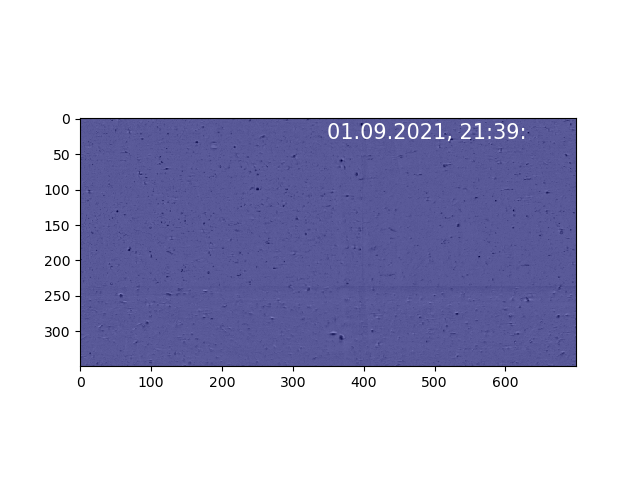

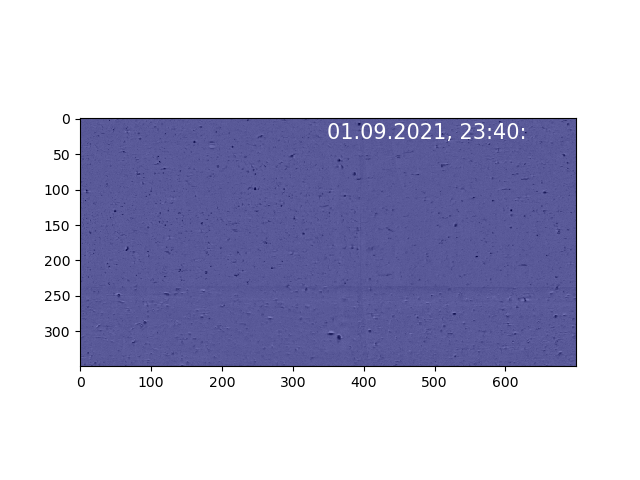

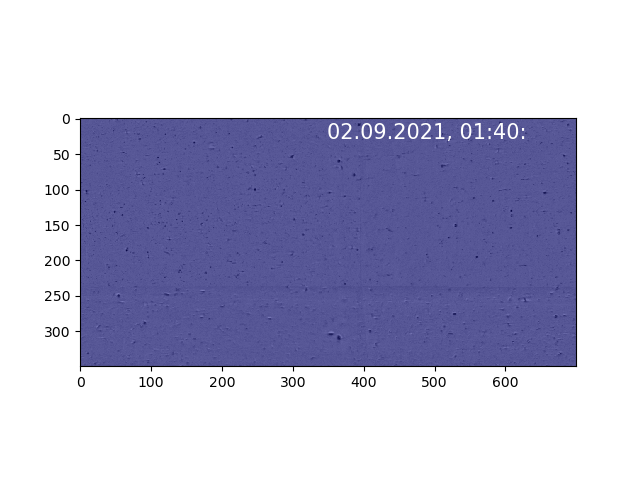

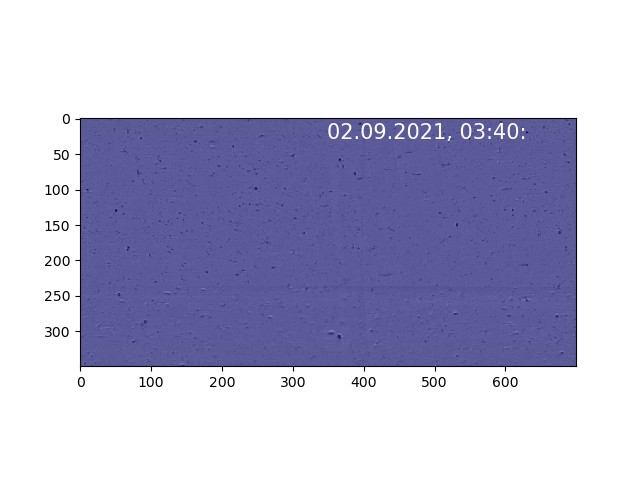

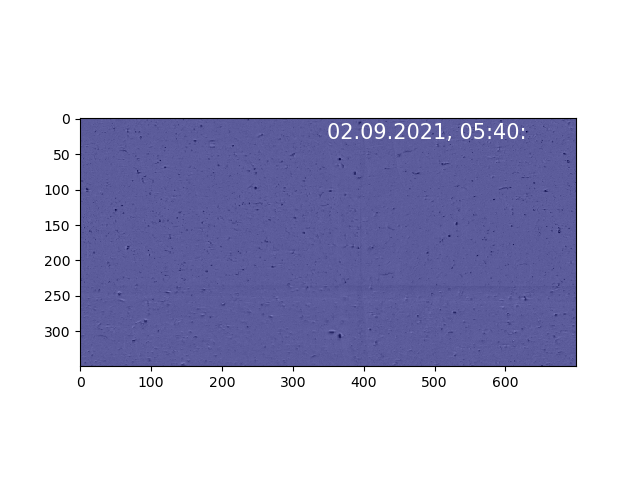

...

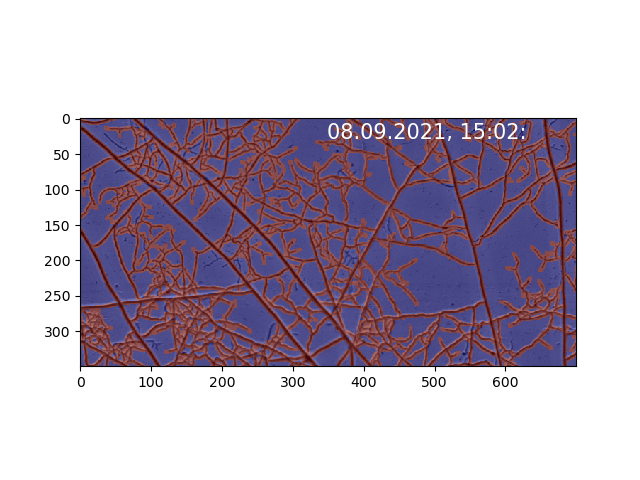

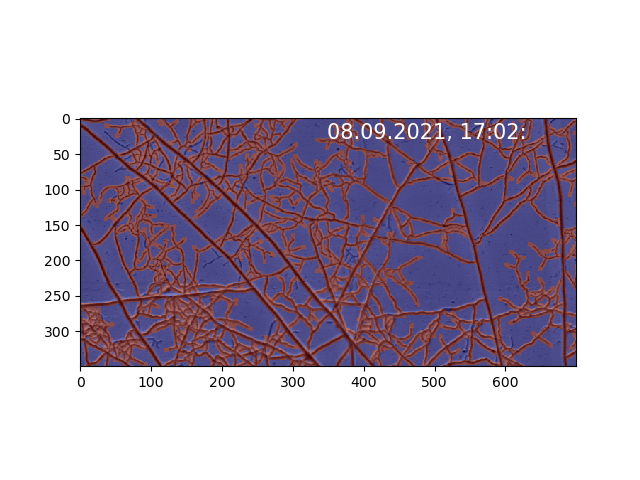

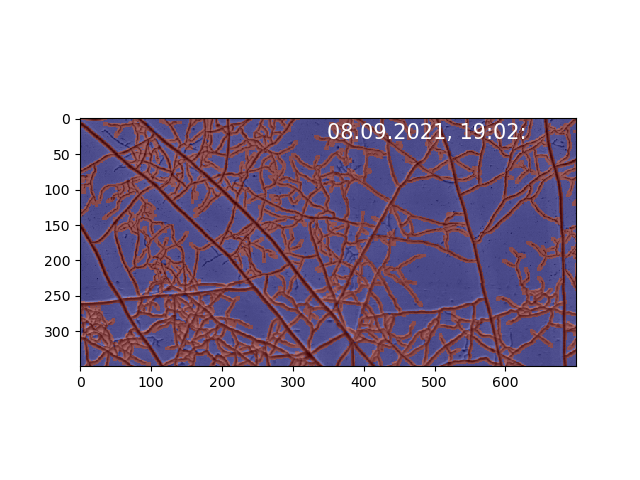

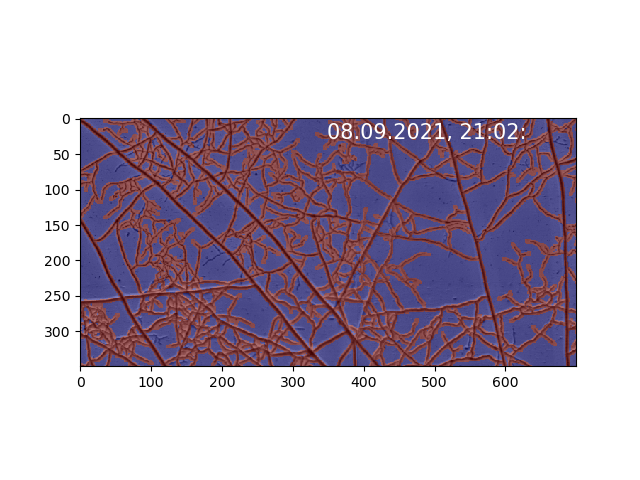

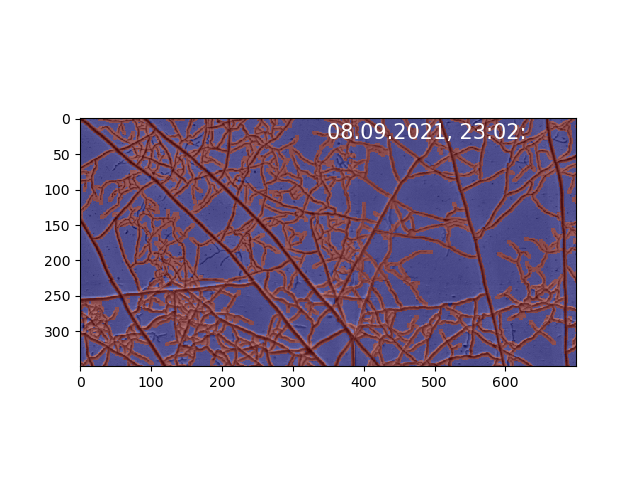

In [54]:
end = 70
beginx = 3850
endx = 4200
beginy = 4450
endy = 5150
for i in range(end):
    plt.close('all')
    time=str(select.loc[select['folder']==folder_list[start+i]]["date"].iloc[0])
    plot_t_tp1([],[],None,None,skels[i][beginx:endx,beginy:endy],ims[i][beginx:endx,beginy:endy],time=time,fontsize = 15)
    plt.savefig(f'Figure/im{i}')
    # break

img_array = []
for i in range(end):
    img = cv2.imread(f'Figure/im{i}.png')
    img_array.append(img)
# plot_t_tp1([],[],None,None,skels[10][3350:3700,4950:5650],ims[10][3350:3700,4950:5650])
imageio.mimsave(f'Figure/move_Agg2.mp4', img_array)

In [27]:
def plot_t_tp1(
    node_list_t,
    node_list_tp1,
    pos_t,
    pos_tp1,
    imt,
    imtp1,
    relabel_t=lambda x: x,
    relabel_tp1=lambda x: x,
    shift=(0, 0),
    compress=1,
    save="",
    time=None,
    gray=False,
    fontsize = 25
):
    right = 0.90
    top = 0.90
    if len(save) >= 1:
        fig = plt.figure(figsize=(14, 12))
        size = 10
    else:
        fig = plt.figure()
        size = 5
    ax = fig.add_subplot(111)
    ax.imshow(imtp1, cmap="gray", interpolation="none")
    if gray: 
        ax.imshow(imt, cmap="gray", alpha=0.5, interpolation="none")
    else:
        ax.imshow(imt, cmap="jet", alpha=0.5, interpolation="none")

    bbox_props1 = dict(boxstyle="circle", fc="grey")
    bbox_props2 = dict(boxstyle="circle", fc="white")
    ax.text(
        right,
        top,
        time,
        horizontalalignment="right",
        verticalalignment="bottom",
        transform=ax.transAxes,
        color="white",
        fontsize = fontsize,
    )
    for node in node_list_t:
        t = ax.text(
            (pos_t[node][1] - shift[1]) // compress,
            (pos_t[node][0] - shift[0]) // compress,
            str(relabel_t(node)),
            ha="center",
            va="center",
            size=size,
            bbox=bbox_props1,
        )
    for node in node_list_tp1:
        if node in pos_tp1.keys():
            t = ax.text(
                (pos_tp1[node][1] - shift[1]) // compress,
                (pos_tp1[node][0] - shift[0]) // compress,
                str(relabel_tp1(node)),
                ha="center",
                va="center",
                size=size,
                bbox=bbox_props2,
            )
    if len(save) >= 1:
        plt.savefig(save)
        plt.close(fig)
    else:
        plt.show()

In [12]:
def make_video_node(node,t0,t1,anchor = None,ranges = 1000):
    for t in range(t0,t1):
        save=f'Figure/im**{t}'
        plot_node_skel(node,t,ranges = ranges,save = save, anchor =anchor,anchor_time_display = t0)
    img_array = []
    for t in range(t0,t1):
        img = cv2.imread(f'Figure/im**{t}.png')
        height, width, layers = img.shape
        size = (width,height)
        ratio = 5 
        for i in range(int(ratio*get_time(exp,t,t+1))):
            img_array.append(img)
    imageio.mimsave(f'Figure/{node.experiment.plate}_{node.label}.mp4', img_array)

In [13]:
def get_time(exp,t,tp1):#redefined here to avoid loop in import
    seconds = (exp.dates[tp1]-exp.dates[t]).total_seconds()
    return(seconds/3600)
def plot_node_skel(node,t0,ranges = 1000,save='',anchor = None,anchor_time_display = 0):
    t = t0
    exp = node.experiment
    anchor_time = t0 if (anchor is None) else anchor
    center = node.pos(anchor_time)[1],node.pos(anchor_time)[0]
    window = (center[0]-ranges,center[0]+ranges,center[1]-ranges,center[1]+ranges)
    skelet,rot,trans = get_skeleton(node.experiment,window,t,node.experiment.directory)
#     im_stitched = get_im_stitched(exp,window,t,directory)
    tips = [node.label]
    junction = []
    # tips = [node.label for node in exp.nodes if t in node.ts() and node.degree(t) ==1 and node.pos(t)[1]>=window[0] and node.pos(t)[1]<=window[1] and node.pos(t)[0]>=window[2] and node.pos(t)[0]<=window[3]]
    # junction =  [node.label for node in exp.nodes if t in node.ts() and node.degree(t) >=2 and node.pos(t)[1]>=window[0] and node.pos(t)[1]<=window[1] and node.pos(t)[0]>=window[2] and node.pos(t)[0]<=window[3]]
    _ = plot_t_tp1(junction,tips,exp.positions[t],exp.positions[t],skelet,skelet,shift=(window[2],window[0]),save = save, time=f't={int(get_time(exp,anchor_time_display,t))}h')

In [14]:
make_video_node(hyph.end,8,19,ranges = 3000)

findfont: Font family ['verdana'] not found. Falling back to DejaVu Sans.
findfont: Font family ['verdana'] not found. Falling back to DejaVu Sans.
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1400, 1200) to (1408, 1200) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x73f9980] Warning: data is not aligned! This can lead to a speed loss
